In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from wordcloud import WordCloud
from wordcloud import ImageColorGenerator
from wordcloud import STOPWORDS

import ipywidgets as widgets
from ipywidgets import interact, interact_manual

In [2]:
books_df = pd.read_csv("original_data/books_data.csv")

FileNotFoundError: [Errno 2] No such file or directory: 'original_data/books_data.csv'

In [4]:
books_df.head()

,Title,description,authors,image,previewLink,publisher,publishedDate,infoLink,categories,ratingsCount
0,Its Only Art If Its Well Hung!,NaN,['Julie Strain'],http://books.google.com/books/content?id=DykPA...,http://books.google.nl/books?id=DykPAAAACAAJ&d...,NaN,1996,http://books.google.nl/books?id=DykPAAAACAAJ&d...,['Comics & Graphic Novels'],NaN
1,Dr. Seuss: American Icon,Philip Nel takes a fascinating look into the k...,['Philip Nel'],http://books.google.com/books/content?id=IjvHQ...,http://books.google.nl/books?id=IjvHQsCn_pgC&p...,A&C Black,2005-01-01,http://books.google.nl/books?id=IjvHQsCn_pgC&d...,['Biography & Autobiography'],NaN
2,Wonderful Worship in Smaller Churches,This resource includes twelve principles in un...,['David R. Ray'],http://books.google.com/books/content?id=2tsDA...,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,NaN,2000,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,['Religion'],NaN
3,Whispers of the Wicked Saints,Julia Thomas finds her life spinning out of co...,['Veronica Haddon'],http://books.google.com/books/content?id=aRSIg...,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,iUniverse,2005-02,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,['Fiction'],NaN
4,"Nation Dance: Religion, Identity and Cultural ...",NaN,['Edward Long'],NaN,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,2003-03-01,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,NaN


In [5]:
books_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 212404 entries, 0 to 212403
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Title          212403 non-null  object 
 1   description    143962 non-null  object 
 2   authors        180991 non-null  object 
 3   image          160329 non-null  object 
 4   previewLink    188568 non-null  object 
 5   publisher      136518 non-null  object 
 6   publishedDate  187099 non-null  object 
 7   infoLink       188568 non-null  object 
 8   categories     171205 non-null  object 
 9   ratingsCount   49752 non-null   float64
dtypes: float64(1), object(9)
memory usage: 16.2+ MB


In [6]:
books_df.isna().sum()

Title                 1
description       68442
authors           31413
image             52075
previewLink       23836
publisher         75886
publishedDate     25305
infoLink          23836
categories        41199
ratingsCount     162652
dtype: int64

In [15]:
# Determining how many categories we are working with:

pd.set_option('display.max_rows', None)
categories_list = books_df["categories"].value_counts().index.tolist()
len(categories_list)

10883

NOTES:
1. There are 68,442 missing book descriptions and 143,962 present book descriptions
2. There are 10,883 categories
3. There are approximately 600 "bible" and 400 "bibles" - perhaps we remove these data as bible ratings are very subjective and do not often have descriptive book covers.
4. 

<Axes: xlabel='count', ylabel='category'>

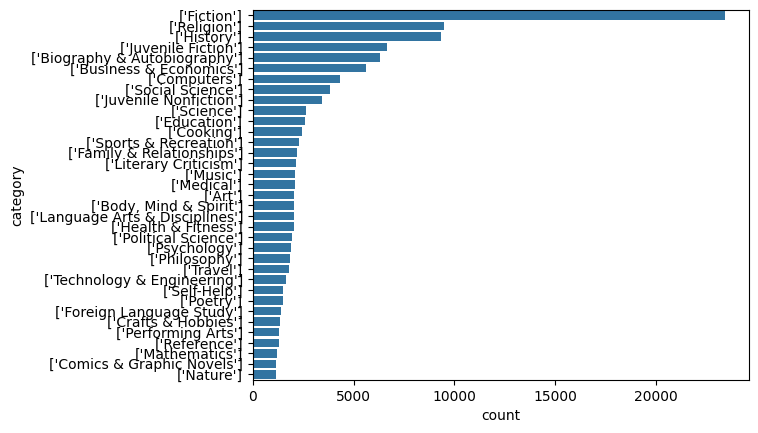

In [37]:
# Visualising some of the most common categories:

category_counts = books_df["categories"].value_counts()
category_counts = category_counts.rename_axis("category").reset_index()
over_500_cnt = category_counts[category_counts["count"] > 500]
over_1000_cnt = category_counts[category_counts["count"] > 1000]

sns.barplot(data = over_1000_cnt,
         y = "category",
         x = "count"
        )

In [52]:
# How many books within the category "['Bible']" are missing a description?

books_df["description"][books_df["categories"] == "['Bible']"].isna().sum()


520

It appears that books of a particular category might be more likely to be missing a description. Next I will group by category and count NaN values

In [79]:
# NOTE: .count() only counts the number of non-null values!

description_count_NoNaN_df = books_df.groupby("categories")["description"].count().sort_values(ascending=False).reset_index()
description_count_NoNaN_df.rename(columns={"description": "description_cnt_noNaN"})

,categories,description_cnt_noNaN
0,['Fiction'],22393
1,['History'],8845
2,['Religion'],8758
3,['Juvenile Fiction'],6572
4,['Biography & Autobiography'],6047
5,['Business & Economics'],5285
6,['Computers'],4119
7,['Social Science'],3612
8,['Juvenile Nonfiction'],3312
9,['Science'],2422


In [76]:
# .size() returns the number of rows in each group (including nan values)

description_count_withNaN_df = books_df.groupby("categories")["description"].size().sort_values(ascending=False).reset_index()
description_count_withNaN_df.rename(columns={"description": "description_cnt_withNaN"})

,categories,description_cnt_withNaN
0,['Fiction'],23419
1,['Religion'],9459
2,['History'],9330
3,['Juvenile Fiction'],6643
4,['Biography & Autobiography'],6324
5,['Business & Economics'],5625
6,['Computers'],4312
7,['Social Science'],3834
8,['Juvenile Nonfiction'],3446
9,['Science'],2623


In [80]:
description_count_df = pd.merge(description_count_withNaN_df, description_count_NoNaN_df, on="categories")

In [89]:
description_count_df.rename(columns={"description_x": "description_cnt_withNaN", "description_y": "description_cnt_noNaN"}, inplace=True)

In [92]:
description_count_df["NaN_cnt"] = description_count_df["description_cnt_withNaN"] - description_count_df["description_cnt_noNaN"]

In [93]:
description_count_df

,categories,description_cnt_withNaN,description_cnt_noNaN,NaN_cnt
0,['Fiction'],23419,22393,1026
1,['Religion'],9459,8758,701
2,['History'],9330,8845,485
3,['Juvenile Fiction'],6643,6572,71
4,['Biography & Autobiography'],6324,6047,277
5,['Business & Economics'],5625,5285,340
6,['Computers'],4312,4119,193
7,['Social Science'],3834,3612,222
8,['Juvenile Nonfiction'],3446,3312,134
9,['Science'],2623,2422,201


In [102]:
subset = description_count_df.iloc[0:26]
subset

,categories,description_cnt_withNaN,description_cnt_noNaN,NaN_cnt
0,['Fiction'],23419,22393,1026
1,['Religion'],9459,8758,701
2,['History'],9330,8845,485
3,['Juvenile Fiction'],6643,6572,71
4,['Biography & Autobiography'],6324,6047,277
5,['Business & Economics'],5625,5285,340
6,['Computers'],4312,4119,193
7,['Social Science'],3834,3612,222
8,['Juvenile Nonfiction'],3446,3312,134
9,['Science'],2623,2422,201


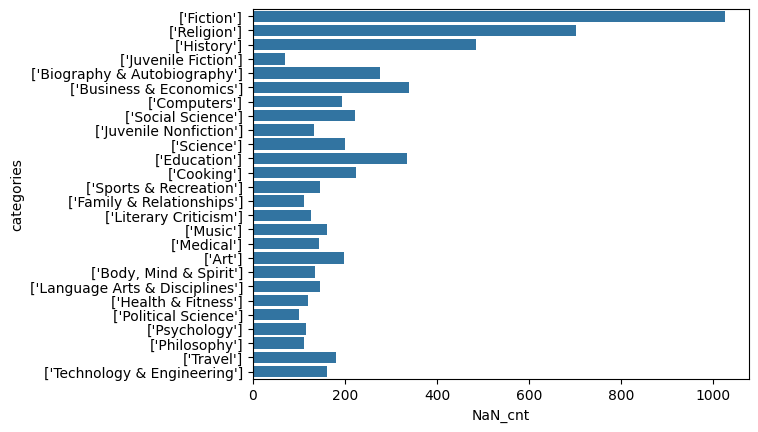

In [103]:
sns.barplot(data = subset,
            y = "categories",
            x = "NaN_cnt"
           )

plt.show()

<Figure size 1400x1400 with 0 Axes>

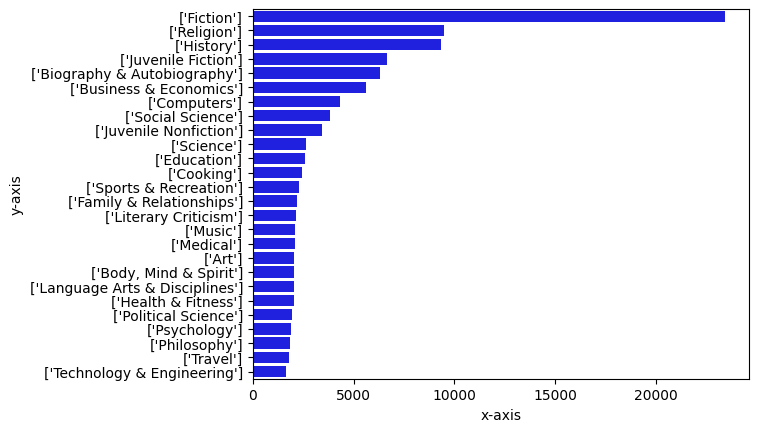

In [107]:
plt.figure(figsize=(14, 14))

# creating subplots
ax = plt.subplots()
 
# plotting columns
ax = sns.barplot(data = subset,
                  y = "categories",
                  x = "NaN_cnt",
                  color='r'
                  )

ax = sns.barplot(data = subset,
                  y = "categories",
                  x = "description_cnt_withNaN",
                  color='b'
                  )
 
# renaming the axes
ax.set(xlabel="x-axis", ylabel="y-axis")
 
# visualizing illustration
plt.show()

ValueError: too many values to unpack (expected 2)

In [115]:
description_count_df["total"] = description_count_df["description_cnt_withNaN"] / description_count_df["description_cnt_withNaN"] * 100
description_count_df["NaN_relative"] = description_count_df["NaN_cnt"] / description_count_df["description_cnt_withNaN"] * 100

In [123]:
description_count_df.head(50)

,categories,description_cnt_withNaN,description_cnt_noNaN,NaN_cnt,total,NaN_relative
0,['Fiction'],23419,22393,1026,100.0,4.381058
1,['Religion'],9459,8758,701,100.0,7.410931
2,['History'],9330,8845,485,100.0,5.198285
3,['Juvenile Fiction'],6643,6572,71,100.0,1.068794
4,['Biography & Autobiography'],6324,6047,277,100.0,4.380139
5,['Business & Economics'],5625,5285,340,100.0,6.044444
6,['Computers'],4312,4119,193,100.0,4.475881
7,['Social Science'],3834,3612,222,100.0,5.790297
8,['Juvenile Nonfiction'],3446,3312,134,100.0,3.888566
9,['Science'],2623,2422,201,100.0,7.662981


In [124]:
subset = description_count_df.iloc[0:51]
subset

,categories,description_cnt_withNaN,description_cnt_noNaN,NaN_cnt,total,NaN_relative
0,['Fiction'],23419,22393,1026,100.0,4.381058
1,['Religion'],9459,8758,701,100.0,7.410931
2,['History'],9330,8845,485,100.0,5.198285
3,['Juvenile Fiction'],6643,6572,71,100.0,1.068794
4,['Biography & Autobiography'],6324,6047,277,100.0,4.380139
5,['Business & Economics'],5625,5285,340,100.0,6.044444
6,['Computers'],4312,4119,193,100.0,4.475881
7,['Social Science'],3834,3612,222,100.0,5.790297
8,['Juvenile Nonfiction'],3446,3312,134,100.0,3.888566
9,['Science'],2623,2422,201,100.0,7.662981


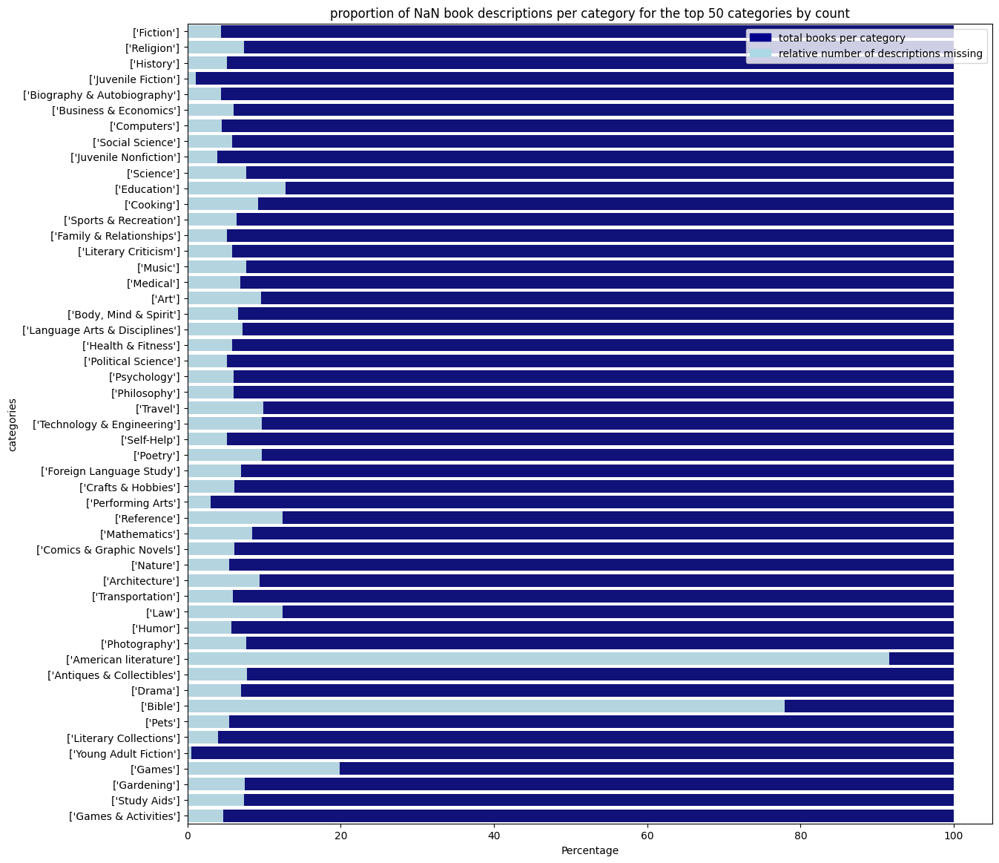

In [127]:
plt.figure(figsize=(14, 14))

# bar chart 1 -> top bars (group of 'smoker=No')
bar1 = sns.barplot(x="total",  y="categories", data=subset, color='darkblue')

# bar chart 2 -> bottom bars (group of 'smoker=Yes')
bar2 = sns.barplot(x="NaN_relative", y="categories", data=subset, color='lightblue')

# add legend
top_bar = mpatches.Patch(color='darkblue', label='total books per category')
bottom_bar = mpatches.Patch(color='lightblue', label='relative number of descriptions missing')
plt.legend(handles=[top_bar, bottom_bar])

# show the graph
plt.title("proportion of NaN book descriptions per category for the top 50 categories by count")
plt.xlabel("Percentage")
plt.show()

In [139]:
top_50_cat = subset["categories"].tolist()
top_50_cat

["['Fiction']",
 "['Religion']",
 "['History']",
 "['Juvenile Fiction']",
 "['Biography & Autobiography']",
 "['Business & Economics']",
 "['Computers']",
 "['Social Science']",
 "['Juvenile Nonfiction']",
 "['Science']",
 "['Education']",
 "['Cooking']",
 "['Sports & Recreation']",
 "['Family & Relationships']",
 "['Literary Criticism']",
 "['Music']",
 "['Medical']",
 "['Art']",
 "['Body, Mind & Spirit']",
 "['Language Arts & Disciplines']",
 "['Health & Fitness']",
 "['Political Science']",
 "['Psychology']",
 "['Philosophy']",
 "['Travel']",
 "['Technology & Engineering']",
 "['Self-Help']",
 "['Poetry']",
 "['Foreign Language Study']",
 "['Crafts & Hobbies']",
 "['Performing Arts']",
 "['Reference']",
 "['Mathematics']",
 "['Comics & Graphic Novels']",
 "['Nature']",
 "['Architecture']",
 "['Transportation']",
 "['Law']",
 "['Humor']",
 "['Photography']",
 "['American literature']",
 "['Antiques & Collectibles']",
 "['Drama']",
 "['Bible']",
 "['Pets']",
 "['Literary Collections']

In [149]:
def is_top50_cat(x):
    if x in top_50_cat:
        return True
    else:
        return False

In [150]:
books_df["Top_50_bool"] = books_df["categories"].apply(is_top50_cat)

In [152]:
books_df.head()

,Title,description,authors,image,previewLink,publisher,publishedDate,infoLink,categories,ratingsCount,Top_50_bool
0,Its Only Art If Its Well Hung!,NaN,['Julie Strain'],http://books.google.com/books/content?id=DykPA...,http://books.google.nl/books?id=DykPAAAACAAJ&d...,NaN,1996,http://books.google.nl/books?id=DykPAAAACAAJ&d...,['Comics & Graphic Novels'],NaN,True
1,Dr. Seuss: American Icon,Philip Nel takes a fascinating look into the k...,['Philip Nel'],http://books.google.com/books/content?id=IjvHQ...,http://books.google.nl/books?id=IjvHQsCn_pgC&p...,A&C Black,2005-01-01,http://books.google.nl/books?id=IjvHQsCn_pgC&d...,['Biography & Autobiography'],NaN,True
2,Wonderful Worship in Smaller Churches,This resource includes twelve principles in un...,['David R. Ray'],http://books.google.com/books/content?id=2tsDA...,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,NaN,2000,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,['Religion'],NaN,True
3,Whispers of the Wicked Saints,Julia Thomas finds her life spinning out of co...,['Veronica Haddon'],http://books.google.com/books/content?id=aRSIg...,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,iUniverse,2005-02,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,['Fiction'],NaN,True
4,"Nation Dance: Religion, Identity and Cultural ...",NaN,['Edward Long'],NaN,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,2003-03-01,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,NaN,False


In [155]:
data = books_df[books_df["Top_50_bool"] == True]
data.head()

,Title,description,authors,image,previewLink,publisher,publishedDate,infoLink,categories,ratingsCount,Top_50_bool
0,Its Only Art If Its Well Hung!,NaN,['Julie Strain'],http://books.google.com/books/content?id=DykPA...,http://books.google.nl/books?id=DykPAAAACAAJ&d...,NaN,1996,http://books.google.nl/books?id=DykPAAAACAAJ&d...,['Comics & Graphic Novels'],NaN,True
1,Dr. Seuss: American Icon,Philip Nel takes a fascinating look into the k...,['Philip Nel'],http://books.google.com/books/content?id=IjvHQ...,http://books.google.nl/books?id=IjvHQsCn_pgC&p...,A&C Black,2005-01-01,http://books.google.nl/books?id=IjvHQsCn_pgC&d...,['Biography & Autobiography'],NaN,True
2,Wonderful Worship in Smaller Churches,This resource includes twelve principles in un...,['David R. Ray'],http://books.google.com/books/content?id=2tsDA...,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,NaN,2000,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,['Religion'],NaN,True
3,Whispers of the Wicked Saints,Julia Thomas finds her life spinning out of co...,['Veronica Haddon'],http://books.google.com/books/content?id=aRSIg...,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,iUniverse,2005-02,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,['Fiction'],NaN,True
5,The Church of Christ: A Biblical Ecclesiology ...,In The Church of Christ: A Biblical Ecclesiolo...,['Everett Ferguson'],http://books.google.com/books/content?id=kVqRa...,http://books.google.nl/books?id=kVqRaiPlx88C&p...,Wm. B. Eerdmans Publishing,1996,http://books.google.nl/books?id=kVqRaiPlx88C&d...,['Religion'],5.0,True


In [160]:
@interact

# data = books_df[books_df["Top_50_bool"] == True]

def wordcloud_by_programme(category=data["categories"].value_counts().index.tolist()):
    text = " ".join(i for i in data["description"][data["categories"]==category].astype(str))
    stopwords = list(STOPWORDS) + ["book", "one", "s"]
    wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
    plt.figure( figsize=(15,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title("Book descriptions word cloud by category for top 50 categories")
    # txt="Figure 2: The wordcloud above shows that there is a clear theme among Generation learners who self-report having special needs. The most commonly disclosed special needs are Depression and Anxiety. Autism and ADHD are relatively common as well. It is important to know that these barriers are not necessarily captured in the barriers count shown in Figure 1 above and are often experienced in-addition to other demographic and situational challenges. It is very important that learners who disclose special needs get the accomodations they need to succeed in the bootcamp."
    # plt.figtext(0.5, 0.05, txt, wrap=True, horizontalalignment='center', fontsize=16, color="0.5", style='italic')
    plt.show()

interactive(children=(Dropdown(description='category', options=("['Fiction']", "['Religion']", "['History']", …

In [167]:
# how many nans do we have in the categories column?

books_df[books_df["categories"].isna()]["description"].isna().sum()

35125

In [168]:
books_df["categories"].isna().sum()

41199

In [169]:
books_df["description"].isna().sum()

68442

In [170]:
books_df[books_df["description"].isna()]["categories"].isna().sum()

35125

In [171]:
books_df["ratingsCount"].isna().sum()

162652

In [173]:
books_df.size

2336444

- What do we do with the books that have no ratings count? 
- Double check that the ratings count matches the data in the ratings table.


In [174]:
# checking if the "ratingsCount" feature in the books dataset matches the count in the ratings dataset

ratings_df = pd.read_csv("original_data/Books_rating.csv")

In [175]:
ratings_df.head()

,Id,Title,Price,User_id,profileName,review/helpfulness,review/score,review/time,review/summary,review/text
0,1882931173,Its Only Art If Its Well Hung!,NaN,AVCGYZL8FQQTD,"Jim of Oz ""jim-of-oz""",7/7,4.0,940636800,Nice collection of Julie Strain images,This is only for Julie Strain fans. It's a col...
1,0826414346,Dr. Seuss: American Icon,NaN,A30TK6U7DNS82R,Kevin Killian,10/10,5.0,1095724800,Really Enjoyed It,I don't care much for Dr. Seuss but after read...
2,0826414346,Dr. Seuss: American Icon,NaN,A3UH4UZ4RSVO82,John Granger,10/11,5.0,1078790400,Essential for every personal and Public Library,"If people become the books they read and if ""t..."
3,0826414346,Dr. Seuss: American Icon,NaN,A2MVUWT453QH61,"Roy E. Perry ""amateur philosopher""",7/7,4.0,1090713600,Phlip Nel gives silly Seuss a serious treatment,"Theodore Seuss Geisel (1904-1991), aka &quot;D..."
4,0826414346,Dr. Seuss: American Icon,NaN,A22X4XUPKF66MR,"D. H. Richards ""ninthwavestore""",3/3,4.0,1107993600,Good academic overview,Philip Nel - Dr. Seuss: American IconThis is b...


In [188]:
titles = ratings_df["Title"].value_counts().index.tolist()
title_counts = ratings_df["Title"].value_counts().tolist()

In [191]:
title_count_dict = dict(zip(titles, title_counts))

In [197]:
books_df.head()

,Title,description,authors,image,previewLink,publisher,publishedDate,infoLink,categories,ratingsCount,Top_50_bool
0,Its Only Art If Its Well Hung!,NaN,['Julie Strain'],http://books.google.com/books/content?id=DykPA...,http://books.google.nl/books?id=DykPAAAACAAJ&d...,NaN,1996,http://books.google.nl/books?id=DykPAAAACAAJ&d...,['Comics & Graphic Novels'],NaN,True
1,Dr. Seuss: American Icon,Philip Nel takes a fascinating look into the k...,['Philip Nel'],http://books.google.com/books/content?id=IjvHQ...,http://books.google.nl/books?id=IjvHQsCn_pgC&p...,A&C Black,2005-01-01,http://books.google.nl/books?id=IjvHQsCn_pgC&d...,['Biography & Autobiography'],NaN,True
2,Wonderful Worship in Smaller Churches,This resource includes twelve principles in un...,['David R. Ray'],http://books.google.com/books/content?id=2tsDA...,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,NaN,2000,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,['Religion'],NaN,True
3,Whispers of the Wicked Saints,Julia Thomas finds her life spinning out of co...,['Veronica Haddon'],http://books.google.com/books/content?id=aRSIg...,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,iUniverse,2005-02,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,['Fiction'],NaN,True
4,"Nation Dance: Religion, Identity and Cultural ...",NaN,['Edward Long'],NaN,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,2003-03-01,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,NaN,False


In [210]:
def comparing_rating_count(ratingsCount, Title):
    if Title in titles:
        if ratingsCount == title_count_dict[Title]:
            return True
        else:
            return False
    else:
        return False

In [211]:
# .apply(lambda x: calculate_percentage(x['PCM'], x['HE']),axis=1)

books_df["rating_count_check"] = books_df.apply(lambda x: comparing_rating_count(x["ratingsCount"], x["Title"]), axis=1)

In [214]:
books_df[books_df["ratingsCount"].notna()].head(20)

,Title,description,authors,image,previewLink,publisher,publishedDate,infoLink,categories,ratingsCount,Top_50_bool,rating_count_check
5,The Church of Christ: A Biblical Ecclesiology ...,In The Church of Christ: A Biblical Ecclesiolo...,['Everett Ferguson'],http://books.google.com/books/content?id=kVqRa...,http://books.google.nl/books?id=kVqRaiPlx88C&p...,Wm. B. Eerdmans Publishing,1996,http://books.google.nl/books?id=kVqRaiPlx88C&d...,['Religion'],5.0,True,False
7,A Walk in the Woods: a Play in Two Acts,NaN,['Lee Blessing'],NaN,http://books.google.nl/books?id=6HDOwAEACAAJ&d...,NaN,1988,http://books.google.nl/books?id=6HDOwAEACAAJ&d...,NaN,3.0,False,True
31,Voices from the Farm: Adventures in Community ...,"Twenty-five years ago, at the height of the co...",['Rupert Fike'],http://books.google.com/books/content?id=IjTAB...,http://books.google.nl/books?id=IjTABgAAQBAJ&p...,Book Publishing Company,2012-08-21,https://play.google.com/store/books/details?id...,['Biography & Autobiography'],1.0,True,False
33,The Battleship Bismarck,The Bismarck is perhaps the most famous – and ...,['Stefan Draminski'],http://books.google.com/books/content?id=nxttD...,http://books.google.nl/books?id=nxttDwAAQBAJ&p...,Bloomsbury Publishing,2018-09-20,https://play.google.com/store/books/details?id...,['History'],1.0,True,False
35,Mini-mysteries,NaN,NaN,http://books.google.com/books/content?id=mhqyg...,http://books.google.nl/books?id=mhqygn6STHgC&p...,Remedia Publications,NaN,http://books.google.nl/books?id=mhqygn6STHgC&d...,NaN,1.0,False,False
42,Tess and the Highlander,"In 1543, on a windswept isle off of Scotland, ...",['May Mcgoldrick'],http://books.google.com/books/content?id=VmCRS...,http://books.google.nl/books?id=VmCRSPmY3WkC&d...,Harper Collins,2002-11,http://books.google.nl/books?id=VmCRSPmY3WkC&d...,['Juvenile Fiction'],2.0,True,False
43,Beginner's Yoruba (Hippocrene Beginner's Series),"""Beginner's Yoruba"" is now available with two ...",['Kayode J. Fakinlede'],http://books.google.com/books/content?id=xLe4n...,http://books.google.nl/books?id=xLe4nWzeSw0C&p...,Hippocrene Books,2005,http://books.google.nl/books?id=xLe4nWzeSw0C&d...,['Foreign Language Study'],1.0,True,False
45,King James: Believe the Hype---The LeBron Jame...,LeBron James is a six-foot-eight gift from the...,['Ryan Jones'],http://books.google.com/books/content?id=hlGqe...,http://books.google.nl/books?id=hlGqehyJhywC&p...,St. Martin's Griffin,2003-10-10,https://play.google.com/store/books/details?id...,['Sports & Recreation'],1.0,True,False
47,Building the timber frame house: The revival o...,"For centuries, post-and-beam construction has ...",['Tedd Benson'],http://books.google.com/books/content?id=6uxXo...,http://books.google.nl/books?id=6uxXorE4r-UC&p...,Simon and Schuster,1981-09-01,https://play.google.com/store/books/details?id...,['Architecture'],1.0,True,False
54,"Open marriage;: A new life style for couples,",Advocates the importance of individuality in b...,"[""Nena O'Neill"", ""George O'Neill""]",http://books.google.com/books/content?id=xY2SD...,http://books.google.nl/books?id=xY2SD7v3070C&p...,Rowman & Littlefield,1984,http://books.google.nl/books?id=xY2SD7v3070C&d...,['Family & Relationships'],1.0,True,False


In [215]:
title_count_dict["America at 1750: A Social Portrait"]

18

In [217]:
title_count_dict["Behind the Moon"]

3

In [216]:
ratings_df[ratings_df["Title"]== "America at 1750: A Social Portrait"]

,Id,Title,Price,User_id,profileName,review/helpfulness,review/score,review/time,review/summary,review/text
529,1597400602,America at 1750: A Social Portrait,NaN,NaN,NaN,31/32,5.0,900288000,A superb snapshot of Colonial America up to 1750.,The brilliant historian Richard Hofstadter was...
530,1597400602,America at 1750: A Social Portrait,NaN,A3DKP67DK28RUB,"asphlex ""asphlex""",21/23,5.0,977097600,a sadly incomplete yet fully realized work,This is a magnificent work of historical imagi...
531,1597400602,America at 1750: A Social Portrait,NaN,A3NVWS7SAN5XUG,I.M. Grateful,4/4,5.0,1207094400,mirroring the reader,I find it fascinating that this wonderful glim...
532,1597400602,America at 1750: A Social Portrait,NaN,A01496021AHO2YSV1VTDN,I14 Screwdriver,0/0,5.0,1359158400,An Enlightening Step in All Americans' Past,"One of History's saddest events, I mean in the..."
533,1597400602,America at 1750: A Social Portrait,NaN,A24DTVSHSWZVR5,Harry Eagar,0/0,4.0,1348272000,Time again to read the liberal idea of America,"AMERICA AT 1750: A Social Portrait, by Richard..."
534,1597400602,America at 1750: A Social Portrait,NaN,AFHVL91Y72V4G,K. Lang,8/13,4.0,1066608000,"Breaks Up the Monotony, In My Opinion","To give you a little insight on my opinion, I ..."
535,1597400602,America at 1750: A Social Portrait,NaN,NaN,NaN,6/23,2.0,1028937600,Don't Waste Yout Time,Unless you are under obligation to read this f...
536,1597400602,America at 1750: A Social Portrait,NaN,NaN,NaN,5/23,2.0,1028937600,Don't Waste Yout Time,Unless you are under obligation to read this f...
537,1597400602,America at 1750: A Social Portrait,NaN,NaN,NaN,2/21,2.0,1031011200,"Thick, dry and packed full of somewhat useful ...",To read this book you need to be fully awake a...
910288,0394717953,America at 1750: A Social Portrait,9.62,NaN,NaN,31/32,5.0,900288000,A superb snapshot of Colonial America up to 1750.,The brilliant historian Richard Hofstadter was...


In [218]:
ratings_df[ratings_df["Title"]== "Behind the Moon"]

,Id,Title,Price,User_id,profileName,review/helpfulness,review/score,review/time,review/summary,review/text
685,1569474400,Behind the Moon,NaN,A1COK1C3EQFD67,K. Viker,1/1,4.0,1212710400,"A multicultural, multigenerational story of ac...",This is the story of three friends and their f...
686,1569474400,Behind the Moon,NaN,A1IWWRZJOXOSYP,Lee Armstrong,2/3,4.0,1177977600,Looking for Love in All the Wrong Places,Hsu-Ming Teo's novel was published in Australi...
687,1569474400,Behind the Moon,NaN,A2BDFYA488ZFD5,"Mr. Timothy S. Jones ""mrsweettooth""",0/0,4.0,1274659200,"Thoughtful, contemporary fiction",Excellent novel about cultural/generational bo...


In [ ]:
# 

# NLP TESTING

In [339]:
example_description = books_df["description"][400]
example_description

'Something’s rotten in the land of Xanth—and it’s not just the undead—in this “cheeky” adventure in the New York Times–bestselling series (Publishers Weekly). Horrors and hilarity collide as a fate far worse than death awaits a vivacious young visitor to “the Florida-shaped fantasy land where anything goes and the puns pack every page” (Kirkus Reviews). Breanna, a beautiful young newcomer to the enchanted land of Xanth, must deal with a distressing dilemma. She has unwittingly attracted the affections of King Xeth, ruler of Xanth’s Zombies, who yearns to make her queen of the undead! Her quest to preserve her innocence, and find her destiny, takes her on an exhilarating excursion packed with perils, puzzles, and piles of puns. Zombie Lover will provide a profusion of macabre merriment.'


We will be doing unsupervised NLP since we cannot trust the categories. 

Steps for NLP text classification for book descriptions (MULTILABEL):
1. tokenisation
2. creating the vocabulary


Steps for NLP text classification/ sentiment analysis for book reviews (MULTICLASS):
(Actually this might be supervised because the review score itself is negative, neutral, or positive)


Notes:
- Do LSA on the vocabulary, it is a dimensionality reduction technique (Latent semantic analysis)
- SVD, singular value decomposition, is basically a matrix factorization technique, which decomposes any matrix into 3 generic and familiar matrices
- LDA things to remember: A document is associated with a topic distribution not a specific topic!
- WordNet1 is a huge lexical database for the English language
- Synset is a collection or set of data entities that are considered to be semantically similar
- 

Steps (I think):
1. preprocessing (tokenisation, stemming, remove stop words)
2. construct term-document matrix
3. Apply LSA
4. Clustering or classification - to categorize the descriptions into different groups or classes based on their semantic similarities.
5. Evaluation


In [224]:
ratings_df.head()

,Id,Title,Price,User_id,profileName,review/helpfulness,review/score,review/time,review/summary,review/text
0,1882931173,Its Only Art If Its Well Hung!,NaN,AVCGYZL8FQQTD,"Jim of Oz ""jim-of-oz""",7/7,4.0,940636800,Nice collection of Julie Strain images,This is only for Julie Strain fans. It's a col...
1,0826414346,Dr. Seuss: American Icon,NaN,A30TK6U7DNS82R,Kevin Killian,10/10,5.0,1095724800,Really Enjoyed It,I don't care much for Dr. Seuss but after read...
2,0826414346,Dr. Seuss: American Icon,NaN,A3UH4UZ4RSVO82,John Granger,10/11,5.0,1078790400,Essential for every personal and Public Library,"If people become the books they read and if ""t..."
3,0826414346,Dr. Seuss: American Icon,NaN,A2MVUWT453QH61,"Roy E. Perry ""amateur philosopher""",7/7,4.0,1090713600,Phlip Nel gives silly Seuss a serious treatment,"Theodore Seuss Geisel (1904-1991), aka &quot;D..."
4,0826414346,Dr. Seuss: American Icon,NaN,A22X4XUPKF66MR,"D. H. Richards ""ninthwavestore""",3/3,4.0,1107993600,Good academic overview,Philip Nel - Dr. Seuss: American IconThis is b...


## Step 1: Tokenisation of book descriptions

In [317]:
# create a dataframe with the text "documents". One document per row.
descriptions_df = pd.DataFrame()
descriptions_df["description"] = books_df["description"]

In [318]:
descriptions_df.head()

,description
0,NaN
1,Philip Nel takes a fascinating look into the k...
2,This resource includes twelve principles in un...
3,Julia Thomas finds her life spinning out of co...
4,NaN


In [319]:
descriptions_df.isna().sum()

description    68442
dtype: int64

In [320]:
descriptions_df = descriptions_df[descriptions_df["description"].notnull()].reset_index(drop=True)
descriptions_df.isna().sum()

description    0
dtype: int64

In [321]:
descriptions_df.head()

,description
0,Philip Nel takes a fascinating look into the k...
1,This resource includes twelve principles in un...
2,Julia Thomas finds her life spinning out of co...
3,In The Church of Christ: A Biblical Ecclesiolo...
4,The story for children 10 and up of St. Hyacin...


In [276]:
type(descriptions_df)

pandas.core.frame.DataFrame

In [299]:
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import TfidfVectorizer

In [278]:
# Lets test out the tokeniser on the example description:

example_description = books_df["description"][5]
example_description

"In The Church of Christ: A Biblical Ecclesiology for Today, respected biblical scholar Everett Ferguson presents a genuine biblical theology of the church. By systematically examining the New Testament's teaching on the existence, meaning, and purpose of the church, providing responsible coverage of the traditional topics in ecclesiology, and carefully grounding ecclesiology in the person and work of Christ, Ferguson unveils a comprehensive model of the church that is both biblically centered and relevant to a world on the verge of the twenty-first century."

In [279]:
tokenizer = RegexpTokenizer(r"\w'+|\$[\d\.]+|\S+")

# NOTE: I added an apostrophy after the w in the regular expression to signify that I want to keep contractions together. I may change my mind about this at a later time but this will do for now.

In [280]:
tokens = tokenizer.tokenize(example_description)
tokens

['In',
 'The',
 'Church',
 'of',
 'Christ:',
 'A',
 'Biblical',
 'Ecclesiology',
 'for',
 'Today,',
 'respected',
 'biblical',
 'scholar',
 'Everett',
 'Ferguson',
 'presents',
 'a',
 'genuine',
 'biblical',
 'theology',
 'of',
 'the',
 'church.',
 'By',
 'systematically',
 'examining',
 'the',
 'New',
 "Testament's",
 'teaching',
 'on',
 'the',
 'existence,',
 'meaning,',
 'and',
 'purpose',
 'of',
 'the',
 'church,',
 'providing',
 'responsible',
 'coverage',
 'of',
 'the',
 'traditional',
 'topics',
 'in',
 'ecclesiology,',
 'and',
 'carefully',
 'grounding',
 'ecclesiology',
 'in',
 'the',
 'person',
 'and',
 'work',
 'of',
 'Christ,',
 'Ferguson',
 'unveils',
 'a',
 'comprehensive',
 'model',
 'of',
 'the',
 'church',
 'that',
 'is',
 'both',
 'biblically',
 'centered',
 'and',
 'relevant',
 'to',
 'a',
 'world',
 'on',
 'the',
 'verge',
 'of',
 'the',
 'twenty-first',
 'century.']

In [281]:
# Next make sure the tokens are lowercase. Create a list conprehension to transform the existing tokens list:
stopwords_list = stopwords.words('english')
newstopwords = ['book', 'one', 's']
stopwords_list.extend(newstopwords)

In [284]:
tokens = [tok.lower() for tok in tokens if tok.lower() not in stopwords_list]
tokens

['church',
 'christ:',
 'biblical',
 'ecclesiology',
 'today,',
 'respected',
 'biblical',
 'scholar',
 'everett',
 'ferguson',
 'presents',
 'genuine',
 'biblical',
 'theology',
 'church.',
 'systematically',
 'examining',
 'new',
 "testament's",
 'teaching',
 'existence,',
 'meaning,',
 'purpose',
 'church,',
 'providing',
 'responsible',
 'coverage',
 'traditional',
 'topics',
 'ecclesiology,',
 'carefully',
 'grounding',
 'ecclesiology',
 'person',
 'work',
 'christ,',
 'ferguson',
 'unveils',
 'comprehensive',
 'model',
 'church',
 'biblically',
 'centered',
 'relevant',
 'world',
 'verge',
 'twenty-first',
 'century.']

### Lets create a pre-processing function 

In [327]:
def book_description_unigrams(text, extra_stop_words_list=None):
    """ creates unigrams from books description data. uses RegexpTokenizer, removes stop words, and lowers the case of all tokens"""
    
    tokenizer = RegexpTokenizer(r"\w'+|\$[\d\.]+|\S+")
    tokens = tokenizer.tokenize(text)
    
    stopwords_list = stopwords.words('english')

    try:
        stopwords_list.extend(extra_stop_words_list)
    except:
        pass

    tokens = [tok.lower() for tok in tokens if tok.lower() not in stopwords_list]

    return tokens

In [323]:
test = book_description_unigrams(example_description, ['book', 'one', 's'])

## Step 2: build the vector space

In [328]:
vectorizer = TfidfVectorizer(analyzer=book_description_unigrams)
book_descriptions_tfidf = vectorizer.fit_transform(descriptions_df.description)

In [325]:
descriptions_df.head()

,description
0,Philip Nel takes a fascinating look into the k...
1,This resource includes twelve principles in un...
2,Julia Thomas finds her life spinning out of co...
3,In The Church of Christ: A Biblical Ecclesiolo...
4,The story for children 10 and up of St. Hyacin...


In [331]:
# Lets explore the newly created vector space:

# Save your vector space in a list
vector_space = vectorizer.get_feature_names_out()
len(vector_space)

537669

In [332]:
vector_space[10000:10010]

array(['"prendergast\'s', '"prentice', '"prepare', '"prepared',
       '"preparing', '"preprinted"', '"prequel"', '"prerequisites',
       '"presbyterianism', '"prescribe"'], dtype=object)

In [334]:
# Building latent topics:

lda_model = LatentDirichletAllocation(
    n_components=25,
    doc_topic_prior=0.1,
    topic_word_prior=0.1
)

lda = lda_model.fit(book_descriptions_tfidf)

In [335]:
# Look at our topics
for index, topic in enumerate(lda.components_):
    print(f'Top 30 words for Topic #{index}')
    print([vectorizer.get_feature_names_out()[i] for i in topic.argsort()[:30]])
    print('\n')

Top 30 words for Topic #0
['concur,', 'corporate)', 'work.as', 'verschijnt', 'recognition),', 'ocr(optical', 'typos.', 'mij', 'datzelfde', 'verfilmd', 'gevangenschap', 'gehoord.', 'slavernijsysteem.', 'plantages', 'vertaling.', 'amerikanen', 'slaaf.', "frank.'", 'stomverbaasd', 'geproduceerd', 'northup,', 'stigter', 'onmenselijkheid', 'slaaf,', 'slaat', 'bom', 'omstandigheden,', 'zuiden', 'vrij.', "'ik"]


Top 30 words for Topic #1
['corporate)', 'concur,', 'work.as', 'ocr(optical', 'typos.', 'recognition),', 'aangrijpende', 'datzelfde', 'gevangenschap', 'genomineerd', 'geproduceerd', 'slaaf.', "frank.'", 'onmenselijkheid', 'vertaling.', 'stomverbaasd', 'slavernijsysteem.', 'slaaf,', 'stigter', 'amerikanen', 'plantages', 'gehoord.', 'northup,', 'bom', 'omstandigheden,', 'twaalf', 'zuiden', 'vrij.', "'ik", 'alimentos']


Top 30 words for Topic #2
['corporate)', 'concur,', 'work.as', 'verschijnt', 'typos.', 'recognition),', 'ocr(optical', 'aangrijpende', 'mij', 'datzelfde', 'verfilmd', '

In [345]:
books_df.iloc[300]

Title                                                       El Kybalion
description           El Kybalion es la filosofia hermetica del Anti...
authors                                              ['Tres Iniciados']
image                 http://books.google.com/books/content?id=Fn5Dn...
previewLink           http://books.google.nl/books?id=Fn5DnwEACAAJ&d...
publisher                                                           NaN
publishedDate                                                   2013-11
infoLink              http://books.google.nl/books?id=Fn5DnwEACAAJ&d...
categories                                                          NaN
ratingsCount                                                        NaN
Top_50_bool                                                       False
rating_count_check                                                False
Name: 300, dtype: object

In [348]:
test_df = books_df.iloc[194: 201]
test_df

,Title,description,authors,image,previewLink,publisher,publishedDate,infoLink,categories,ratingsCount,Top_50_bool,rating_count_check
194,Deadville,"In the year 1833, two young brothers journey i...",['Robert F. Jones'],http://books.google.com/books/content?id=tHQhA...,http://books.google.nl/books?id=tHQhAgAAQBAJ&p...,Skyhorse,2013-10-08,https://play.google.com/store/books/details?id...,['Fiction'],NaN,True,False
195,The Tao of I Ching: Way to Divination,A new and refreshing way to understand and uti...,['Tsung Hwa Jou'],http://books.google.com/books/content?id=820EA...,http://books.google.nl/books?id=820EAAAACAAJ&d...,Tuttle Publishing,1989-12-15,http://books.google.nl/books?id=820EAAAACAAJ&d...,"['Body, Mind & Spirit']",NaN,True,False
196,Days of Grass,"The free humans lived underground, secretive, ...",['Tanith Lee'],http://books.google.com/books/content?id=r2mgn...,http://books.google.nl/books?id=r2mgnCKhACYC&p...,Hachette UK,2013-06-24,https://play.google.com/store/books/details?id...,['Fiction'],3.0,True,False
197,"Muchas vidas, muchos sabios",El doctor Brian Weiss -- psiquiatra del hospit...,['Brian L. Weiss'],http://books.google.com/books/content?id=n99eO...,http://books.google.nl/books?id=n99eOXNr2_gC&p...,Simon and Schuster,2012-12-11,https://play.google.com/store/books/details?id...,"['Body, Mind & Spirit']",NaN,True,False
198,New sounds: A listener's guide to new music,Offers profiles of modern composers and musici...,['John Schaefer'],http://books.google.com/books/content?id=23qfA...,http://books.google.nl/books?id=23qfAAAAMAAJ&q...,Harpercollins,1987,http://books.google.nl/books?id=23qfAAAAMAAJ&d...,['Music'],NaN,True,False
199,Old-Fashioned Ckbk,Distributed by the University of Nebraska Pres...,['Don Holm'],http://books.google.com/books/content?id=E6qVM...,http://books.google.nl/books?id=E6qVMst9OO4C&p...,Caxton Press,1969,http://books.google.nl/books?id=E6qVMst9OO4C&d...,['Cooking'],NaN,True,False
200,Musings of an Eccentric Dreamer: An Anthology ...,In het koninkrijk Alban gaat het volk gebukt o...,['Juliet Marillier'],http://books.google.com/books/content?id=5ccvA...,http://books.google.nl/books?id=5ccvAgAAQBAJ&p...,Luitingh Sijthoff Fantasy,2012-07-11,https://play.google.com/store/books/details?id...,['Fiction'],NaN,True,False


In [369]:
test_df["description"].iloc[6]

'In het koninkrijk Alban gaat het volk gebukt onder het schrikbewind van koning Keldec. Het gebruik van magie is er verboden. Contact met een van de vele magische wezens die het land bevolken, wordt steeds vaker met de dood bestraft. De vijftienjarige Neryn is samen met haar vader op de vlucht voor de krijgers van Keldec. Dan gebeurt er iets verschrikkelijks. Haar vader ondergaat als het ware een gedaanteverwisseling, en vóór het goed en wel tot Neryn doordringt, wordt ze door hem verspeeld in een illegaal dobbelspel. Neryn rest geen andere keuze dan zich te schikken naar de wensen van de geheimzinnige onbekende die nu haar heer en meester is. Maar er is hoop. Neryn ontdekt dat zij beschikt over een unieke gave, een onverwacht talent dat haar het doelwit maakt van verschillende partijen, onder wie de trawanten van Keldec. En dat talent komt maar wat van pas als Neryn het vluchten zat is en besluit terug te vechten...'

In [357]:
# import nltk
# nltk.download('crubadan')

[nltk_data] Downloading package crubadan to
[nltk_data]     /Users/meganguidry/nltk_data...
[nltk_data]   Unzipping corpora/crubadan.zip.


True

In [391]:
# ! pip install langdetect
# ! pip install iso639-lang
# from langdetect import detect

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 281.2/281.2 kB 5.4 MB/s eta 0:00:00 MB/s eta 0:00:01


In [393]:
from iso639 import Lang
Lang("nl").name

'Dutch'

In [402]:
# # ! pip install langdetect
# # ! pip install iso639-lang

from NLP_preprocessing import identify_language

In [405]:
books_df["description_language"] = books_df["description"].map(identify_language, na_action='ignore')

In [406]:
books_df["description_language"].value_counts()

description_language
English                    141755
Dutch                         946
Spanish                       375
French                        205
Danish                        153
German                        144
unknown                        47
Italian                        45
Indonesian                     43
Afrikaans                      34
Portuguese                     27
Vietnamese                     22
Catalan                        21
Tagalog                        19
Norwegian                      19
Swedish                        14
Welsh                          12
Romanian                       12
Polish                         12
Estonian                       10
Somali                          8
Japanese                        8
Croatian                        5
Korean                          4
Finnish                         4
Slovenian                       4
Lithuanian                      3
Czech                           3
Swahili (macrolanguage)    

In [407]:
books_df.head()

,Title,description,authors,image,previewLink,publisher,publishedDate,infoLink,categories,ratingsCount,Top_50_bool,rating_count_check,description_language
0,Its Only Art If Its Well Hung!,NaN,['Julie Strain'],http://books.google.com/books/content?id=DykPA...,http://books.google.nl/books?id=DykPAAAACAAJ&d...,NaN,1996,http://books.google.nl/books?id=DykPAAAACAAJ&d...,['Comics & Graphic Novels'],NaN,True,False,NaN
1,Dr. Seuss: American Icon,Philip Nel takes a fascinating look into the k...,['Philip Nel'],http://books.google.com/books/content?id=IjvHQ...,http://books.google.nl/books?id=IjvHQsCn_pgC&p...,A&C Black,2005-01-01,http://books.google.nl/books?id=IjvHQsCn_pgC&d...,['Biography & Autobiography'],NaN,True,False,English
2,Wonderful Worship in Smaller Churches,This resource includes twelve principles in un...,['David R. Ray'],http://books.google.com/books/content?id=2tsDA...,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,NaN,2000,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,['Religion'],NaN,True,False,English
3,Whispers of the Wicked Saints,Julia Thomas finds her life spinning out of co...,['Veronica Haddon'],http://books.google.com/books/content?id=aRSIg...,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,iUniverse,2005-02,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,['Fiction'],NaN,True,False,English
4,"Nation Dance: Religion, Identity and Cultural ...",NaN,['Edward Long'],NaN,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,2003-03-01,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,NaN,False,False,NaN


In [413]:
books_df_English = books_df[books_df["description_language"]=="English"]
books_df_Dutch = books_df[books_df["description_language"]=="Dutch"]
books_df_Spanish = books_df[books_df["description_language"]=="Spanish"]
books_df_French = books_df[books_df["description_language"]=="French"]
books_df_Danish = books_df[books_df["description_language"]=="Danish"]

In [415]:
# category identifications with english books only

# create vector space using the pre-built analyser
vectorizer = TfidfVectorizer(analyzer=book_description_unigrams)
book_descriptions_tfidf = vectorizer.fit_transform(books_df_English.description)

In [416]:
vector_space_english = vectorizer.get_feature_names_out()

In [418]:
# Building latent topics:

lda_model = LatentDirichletAllocation(
    n_components=10,
    doc_topic_prior=0.1,
    topic_word_prior=0.1
)

lda = lda_model.fit(book_descriptions_tfidf)

In [420]:
# Look at our topics
for index, topic in enumerate(lda.components_):
    print(f'Top 30 words for Topic #{index}')
    print([vectorizer.get_feature_names_out()[i] for i in topic.argsort()[:30]])
    print('\n')

Top 30 words for Topic #0
['corporate)', 'concur,', 'work.as', 'recognition),', 'ocr(optical', 'typos.', 'artefact.', '알렉상드르', '뒤마의', 'newsmagazine.', '(lgbt)', 'magoon’s', 'caws', 'beep!', 'goodnights.', 'experience.”—kirkus', 'vroom!', 'december)', 'years—it', 'hamilcar,', 'hamilcar', 'june)', 'stapinski', 'mola', '"nineteen', 'own.”—pittsburgh', 'imagination.”—tana', 'knife.”', 'does.”—slate', 'resist.”—kate']


Top 30 words for Topic #1
['알렉상드르', '뒤마의', '"beast"', 'sept.-may)', '1954-may', '0000-0035,', '1961).', 'issn', '(lgbt)', 'newsmagazine.', 'december)', 'years—it', 'hamilcar', 'hamilcar,', 'june)', 'mola', '"nineteen', '‘unputdownable’', 'own.”—pittsburgh', 'norbury,', 'aegolius', 'on.”—o:', 'drawing-rooms', 'does.”—slate', 'resist.”—kate', 'direction.”—deborah', '[owen]', 'day.”—minneapolis', '1892:', 'force-of-nature']


Top 30 words for Topic #2
['concur,', 'corporate)', 'work.as', 'ocr(optical', 'recognition),', 'typos.', 'artefact.', '알렉상드르', '뒤마의', '"beast"', '1961).',

In [423]:
books_df["previewLink"][3]

'http://books.google.nl/books?id=aRSIgJlq6JwC&dq=Whispers+of+the+Wicked+Saints&hl=&cd=1&source=gbs_api'

In [422]:
books_df["categories"][10]

"['Religion']"

Pre-train a category classifier with labeled movie data

In [426]:
movie_labels_df = pd.read_csv("original_data/mpst_full_data.csv")

In [427]:
movie_labels_df.head()

,imdb_id,title,plot_synopsis,tags,split,synopsis_source
0,tt0057603,I tre volti della paura,Note: this synopsis is for the orginal Italian...,"cult, horror, gothic, murder, atmospheric",train,imdb
1,tt1733125,Dungeons & Dragons: The Book of Vile Darkness,"Two thousand years ago, Nhagruul the Foul, a s...",violence,train,imdb
2,tt0033045,The Shop Around the Corner,"Matuschek's, a gift store in Budapest, is the ...",romantic,test,imdb
3,tt0113862,Mr. Holland's Opus,"Glenn Holland, not a morning person by anyone'...","inspiring, romantic, stupid, feel-good",train,imdb
4,tt0086250,Scarface,"In May 1980, a Cuban man named Tony Montana (A...","cruelty, murder, dramatic, cult, violence, atm...",val,imdb


In [429]:
def book_description_unigrams(text, extra_stop_words_list=None):
    """ creates unigrams from books description data. uses RegexpTokenizer, removes stop words, and lowers the case of all tokens"""
    
    tokenizer = RegexpTokenizer(r"\w'+|\$[\d\.]+|\S+")
    tokens = tokenizer.tokenize(text)
    
    stopwords_list = stopwords.words('english')

    try:
        stopwords_list.extend(extra_stop_words_list)
    except:
        pass

    tokens = [tok.lower() for tok in tokens if tok.lower() not in stopwords_list]

    return tokens

In [458]:
# create vector space (the tfidf scores for each word in the vocabulary) using the pre-built analyser
vectorizer = TfidfVectorizer(analyzer=book_description_unigrams)
movie_descriptions_tfidf = vectorizer.fit_transform(movie_labels_df.plot_synopsis)
X_tfidf = movie_descriptions_tfidf
Y = movie_labels_df["tags"]

In [453]:
movie_descriptions_tfidf.size

5168470

In [457]:
type(movie_descriptions_tfidf)

scipy.sparse._csr.csr_matrix

In [456]:
vector_space_movies = vectorizer.get_feature_names_out()
vector_space_movies[5000:5020]

array(['"feed"', '"feed".', '"feeding', '"feeding"', '"feel', '"feel"',
       '"feel-a-round",', '"feeling', '"feelings', '"feelings"', '"feels',
       '"feeny', '"fell"', '"fellow', '"felony"', '"felt', '"female',
       '"female"', '"feminine', '"feminine"'], dtype=object)

In [462]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import SGDClassifier

x_train, x_test, y_train, y_test = train_test_split(X_tfidf, Y, test_size=0.33, random_state=42)

In [463]:
sgd = SGDClassifier(loss='hinge', penalty='l2', random_state=42, max_iter=25, tol=None, fit_intercept=True, alpha = 0.000009  )

In [466]:
predictions_test = sgd.predict(x_test)

NotFittedError: This SGDClassifier instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

TFIDF in multilabel problem: https://stackoverflow.com/questions/54660886/tf-idf-vectorizer-for-multi-label-classification-problem

In [100]:
%load_ext autoreload

%autoreload 2

In [477]:
from NLP_preprocessing import TEST_func, other_test
other_test()

otehr


In [469]:
import NLP_preprocessing

In [474]:
NLP_preprocessing.TEST_func()
NLP_preprocessing.other_test()

this is a test
otehr


In [3]:
books_df = pd.read_csv("original_data/books_data_with_index.csv")

In [4]:
books_df.head()

,Title,description,authors,image,previewLink,publisher,publishedDate,infoLink,categories,ratingsCount,index
0,Its Only Art If Its Well Hung!,NaN,['Julie Strain'],http://books.google.com/books/content?id=DykPA...,http://books.google.nl/books?id=DykPAAAACAAJ&d...,NaN,1996,http://books.google.nl/books?id=DykPAAAACAAJ&d...,['Comics & Graphic Novels'],NaN,0
1,Dr. Seuss: American Icon,Philip Nel takes a fascinating look into the k...,['Philip Nel'],http://books.google.com/books/content?id=IjvHQ...,http://books.google.nl/books?id=IjvHQsCn_pgC&p...,A&C Black,2005-01-01,http://books.google.nl/books?id=IjvHQsCn_pgC&d...,['Biography & Autobiography'],NaN,1
2,Wonderful Worship in Smaller Churches,This resource includes twelve principles in un...,['David R. Ray'],http://books.google.com/books/content?id=2tsDA...,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,NaN,2000,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,['Religion'],NaN,2
3,Whispers of the Wicked Saints,Julia Thomas finds her life spinning out of co...,['Veronica Haddon'],http://books.google.com/books/content?id=aRSIg...,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,iUniverse,2005-02,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,['Fiction'],NaN,3
4,"Nation Dance: Religion, Identity and Cultural ...",NaN,['Edward Long'],NaN,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,2003-03-01,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,NaN,4


In [73]:
from NLP_preprocessing import identify_language
books_df["description_language"] = books_df["description"].map(identify_language, na_action='ignore')

In [79]:
test_df = books_df[0:50]

In [ ]:
books_df_English = books_df[books_df["description_language"]=="English"]
books_df_Dutch = books_df[books_df["description_language"]=="Dutch"]
books_df_Spanish = books_df[books_df["description_language"]=="Spanish"]
books_df_French = books_df[books_df["description_language"]=="French"]
books_df_Danish = books_df[books_df["description_language"]=="Danish"]

In [ ]:
def book_description_unigrams(text, extra_stop_words_list=None):
    """ creates unigrams from books description data. uses RegexpTokenizer, removes stop words, and lowers the case of all tokens"""
    
    tokenizer = RegexpTokenizer(r"\w'+|\$[\d\.]+|\S+")
    tokens = tokenizer.tokenize(text)
    
    stopwords_list = stopwords.words('english')

    try:
        stopwords_list.extend(extra_stop_words_list)
    except:
        pass

    tokens = [tok.lower() for tok in tokens if tok.lower() not in stopwords_list]

    return tokens

In [ ]:
vectorizer = TfidfVectorizer(analyzer=book_description_unigrams)
book_descriptions_tfidf = vectorizer.fit_transform(descriptions_df.description)

In [ ]:
vector_space_english = vectorizer.get_feature_names_out()

In [15]:
description = books_df["description"][2]
description

'This resource includes twelve principles in understanding small church worship, fifteen practices for planning worship with fewer than 100 people, and suggestions for congregational study.'

In [46]:
r_unigram = Rake()
r_phrase = Rake(min_length=2, max_length=3)
r_unigram.extract_keywords_from_text(description)
r_phrase.extract_keywords_from_text(description)

In [57]:
keyword_dict_scores = r_unigram.get_word_degrees()
words = list(keyword_dict_scores.keys())
words

['resource',
 'includes',
 'twelve',
 'principles',
 'understanding',
 'small',
 'church',
 'worship',
 'fifteen',
 'practices',
 'planning',
 'fewer',
 '100',
 'people',
 'suggestions',
 'congregational',
 'study']

In [59]:
n_grams = r_phrase.get_ranked_phrases() + words
n_grams

['planning worship',
 'fifteen practices',
 'congregational study',
 '100 people',
 'resource',
 'includes',
 'twelve',
 'principles',
 'understanding',
 'small',
 'church',
 'worship',
 'fifteen',
 'practices',
 'planning',
 'fewer',
 '100',
 'people',
 'suggestions',
 'congregational',
 'study']

In [72]:
for index, row in books_df.iterrows():
    if type(row["description"]) == str:
        print(row["description"].notna())

AttributeError: 'str' object has no attribute 'notna'

In [70]:
books_df["description"].notna()

0         False
1          True
2          True
3          True
4         False
          ...  
212399     True
212400     True
212401     True
212402     True
212403     True
Name: description, Length: 212404, dtype: bool

In [104]:
def calculate_ngrams_RAKE(text: str):
    """ generates a list of n-grams for a given input text using RAKE
    """

    r_unigram = Rake()
    r_phrase = Rake(min_length=2, max_length=3)
    r_unigram.extract_keywords_from_text(text)
    r_phrase.extract_keywords_from_text(text)
    
    keyword_dict_scores = r_unigram.get_word_degrees()
    words = list(keyword_dict_scores.keys())
    words
    
    n_grams = r_phrase.get_ranked_phrases() + words
    return " ".join(n_grams)

In [105]:
calculate_ngrams_RAKE(description)

'planning worship fifteen practices congregational study 100 people resource includes twelve principles understanding small church worship fifteen practices planning fewer 100 people suggestions congregational study'

In [114]:
from NLP_preprocessing import calculate_ngrams_RAKE, create_BOW_feature_for_english_descriptions


In [109]:
def create_BOW_feature_for_english_descriptions(df, input_column: str):
    """ generates "bag of words" aka a list of n-grams between 1 and 3 characters long for each row in the input column
        
        Uses the function "calculate_ngrams_RAKE"
    """

    df["english_BOW"] = ""
    for index, row in df.iterrows():
        if row["description_language"] == "English":
            BOW = calculate_ngrams_RAKE(row[input_column])
        else:
            BOW = ''
        df.at[index,'english_BOW'] = BOW

In [110]:
create_BOW_feature_for_english_descriptions(test_df, "description")

/var/folders/62/rv9lbyxx6l110tffps2wcg2r0000gn/T/ipykernel_10155/2423819622.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["english_BOW"] = ""


In [111]:
test_df.head()

,Title,description,authors,image,previewLink,publisher,publishedDate,infoLink,categories,ratingsCount,index,description_language,english_BOW
0,Its Only Art If Its Well Hung!,NaN,['Julie Strain'],http://books.google.com/books/content?id=DykPA...,http://books.google.nl/books?id=DykPAAAACAAJ&d...,NaN,1996,http://books.google.nl/books?id=DykPAAAACAAJ&d...,['Comics & Graphic Novels'],NaN,0,NaN,
1,Dr. Seuss: American Icon,Philip Nel takes a fascinating look into the k...,['Philip Nel'],http://books.google.com/books/content?id=IjvHQ...,http://books.google.nl/books?id=IjvHQsCn_pgC&p...,A&C Black,2005-01-01,http://books.google.nl/books?id=IjvHQsCn_pgC&d...,['Biography & Autobiography'],NaN,1,English,illustrator lane smith energetic cartoon surre...
2,Wonderful Worship in Smaller Churches,This resource includes twelve principles in un...,['David R. Ray'],http://books.google.com/books/content?id=2tsDA...,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,NaN,2000,http://books.google.nl/books?id=2tsDAAAACAAJ&d...,['Religion'],NaN,2,English,planning worship fifteen practices congregatio...
3,Whispers of the Wicked Saints,Julia Thomas finds her life spinning out of co...,['Veronica Haddon'],http://books.google.com/books/content?id=aRSIg...,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,iUniverse,2005-02,http://books.google.nl/books?id=aRSIgJlq6JwC&d...,['Fiction'],NaN,3,English,sever car accident one day reunite miles away ...
4,"Nation Dance: Religion, Identity and Cultural ...",NaN,['Edward Long'],NaN,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,2003-03-01,http://books.google.nl/books?id=399SPgAACAAJ&d...,NaN,NaN,4,NaN,


In [112]:
from sklearn.feature_extraction.text import CountVectorizer

#instantiating and generating the count matrix
count = CountVectorizer()
count_matrix = count.fit_transform(test_df['english_BOW'])

In [113]:
count_matrix.shape

(50, 1664)

In [118]:
type(count_matrix)

scipy.sparse._csr.csr_matrix

In [117]:
list(count.vocabulary_.items())[:5]

[('illustrator', 732),
 ('lane', 820),
 ('smith', 1376),
 ('energetic', 469),
 ('cartoon', 210)]

In [119]:
from sklearn.preprocessing import StandardScaler
from scipy.sparse import csr_matrix

In [122]:
# convert the count matrix to a dense matrix:
dense_count_matrix = count_matrix.toarray()

scale = StandardScaler()
scaled_data = scale.fit_transform(dense_count_matrix)
scaled_data

array([[-0.14285714, -0.14285714, -0.19324699, ..., -0.14285714,
        -0.23735633, -0.14285714],
       [-0.14285714, -0.14285714, -0.19324699, ..., -0.14285714,
        -0.23735633, -0.14285714],
       [-0.14285714, -0.14285714, -0.19324699, ..., -0.14285714,
        -0.23735633, -0.14285714],
       ...,
       [-0.14285714, -0.14285714, -0.19324699, ..., -0.14285714,
        -0.23735633, -0.14285714],
       [-0.14285714, -0.14285714, -0.19324699, ..., -0.14285714,
        -0.23735633, -0.14285714],
       [-0.14285714, -0.14285714, -0.19324699, ..., -0.14285714,
        -0.23735633, -0.14285714]])

In [55]:
# Function1: use rake to create unigrams and phrases
# Use function one with .map to create a new feature called description n-grams. This is our bag of words for each description. with this column create the count matrix.
# save book index??
# PCA
